using CSV", DataFrames, GLM, Random, Statistics

In [4]:
using CSV, DataFrames, GLM, Random, Statistics, Plots


In [2]:
train_df = CSV.read("data/train.csv", DataFrame)
test_df = CSV.read("data/test.csv", DataFrame)

Row,ID,Cement,Slag,Ash,Water,Superplasticizer,Coarse,Fine,Age
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64
1,1,288.0,192.0,0.0,192.0,0.0,932.0,717.8,90
2,2,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28
3,3,153.1,145.0,113.0,178.5,8.0,867.2,824.0,28
4,4,332.5,142.5,0.0,228.0,0.0,932.0,594.0,28
5,5,285.0,190.0,0.0,163.0,7.6,1031.0,685.0,28
6,6,222.4,0.0,96.7,189.3,4.5,967.1,870.3,56
7,7,166.8,250.2,0.0,203.5,0.0,975.6,692.6,90
8,8,265.0,111.0,86.0,195.0,6.0,833.0,790.0,28
9,9,491.0,26.0,123.0,210.0,3.9,882.0,699.0,28


In [3]:
describe(train_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,ID,350.5,1,350.5,700,0,Int64
2,Cement,283.868,102.0,277.0,540.0,0,Float64
3,Slag,74.8664,0.0,24.0,359.4,0,Float64
4,Ash,53.7016,0.0,0.0,200.0,0,Float64
5,Water,181.207,121.8,185.0,246.9,0,Float64
6,Superplasticizer,6.24386,0.0,6.5,32.2,0,Float64
7,Coarse,973.72,801.0,968.0,1145.0,0,Float64
8,Fine,772.727,594.0,778.5,992.6,0,Float64
9,Age,44.9,1,28.0,365,0,Int64



--- 2. Analyse des Corrélations avec la Résistance ---
Corrélation Cement vs Strength : 0.46
Corrélation Slag vs Strength : 0.14
Corrélation Ash vs Strength : -0.07
Corrélation Water vs Strength : -0.31
Corrélation Superplasticizer vs Strength : 0.42
Corrélation Coarse vs Strength : -0.17
Corrélation Fine vs Strength : -0.16
Corrélation Age vs Strength : 0.34


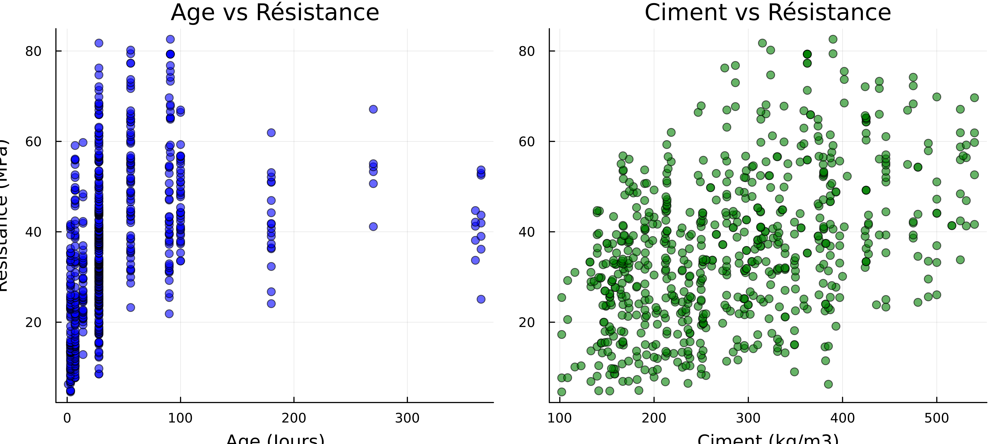

In [4]:
# ==============================================================================
# CONSTAT 2 : Corrélations Clés
# ==============================================================================
println("\n--- 2. Analyse des Corrélations avec la Résistance ---")

# On calcule la corrélation de chaque colonne avec la colonne 'Strength'
# On exclut 'ID' et 'Strength' elle-même de la boucle
target = train_df.Strength
variables = names(train_df)
filter!(x -> x ∉ ["ID", "Strength"], variables) # On retire ID et Strength

for var in variables
    # Calcul de la corrélation de Pearson
    col_data = train_df[!, var]
    correlation = cor(col_data, target)
    
    # Affichage formaté
    println("Corrélation $var vs Strength : $(round(correlation, digits=2))")
end

# ==============================================================================
# CONSTAT 3 : Visualisation (Age vs Strength)
# ==============================================================================
# Pour voir la non-linéarité (montée rapide puis saturation)
p1 = scatter(train_df.Age, train_df.Strength, 
    title = "Age vs Résistance",
    xlabel = "Age (Jours)",
    ylabel = "Résistance (MPa)",
    legend = false,
    alpha = 0.6,    # Transparence pour voir la densité
    color = :blue
)

# Pour voir la corrélation positive du ciment
p2 = scatter(train_df.Cement, train_df.Strength, 
    title = "Ciment vs Résistance",
    xlabel = "Ciment (kg/m3)",
    legend = false,
    alpha = 0.6,
    color = :green
)

# Afficher les deux graphiques côte à côte
plot(p1, p2, layout=(1,2), size=(900, 400))

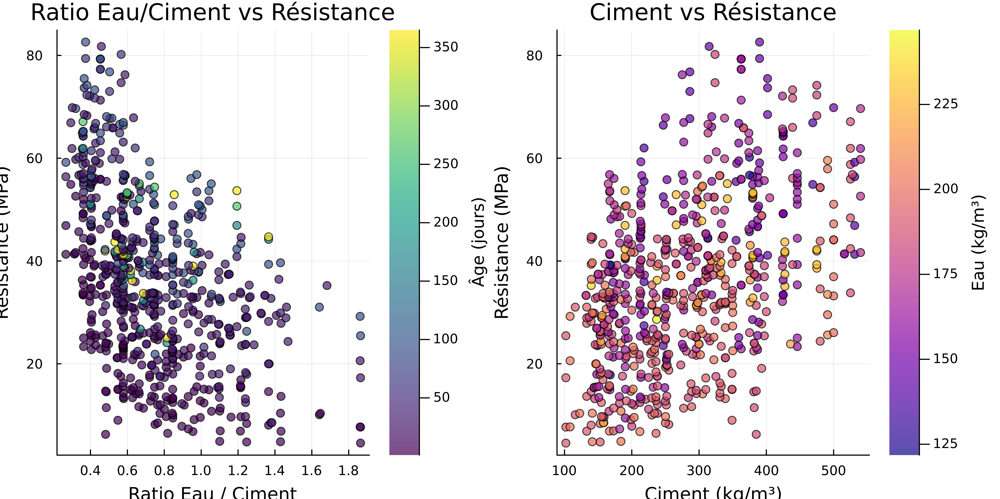

In [ ]:
# On crée le ratio Eau/Ciment (facteur critique en génie civil)
# On ajoute un petit +1 au ciment pour éviter la division par zéro par sécurité
ratio_eau_ciment = train_df.Water ./ (train_df.Cement .+ 1)



# Graphique 1 : L'impact du Ratio Eau/Ciment (Coloré par l'Âge)
p1 = scatter(ratio_eau_ciment, train_df.Strength, 
    zcolor = train_df.Age,              # La couleur dépend de l'âge
    title = "Ratio Eau/Ciment vs Résistance",
    xlabel = "Ratio Eau / Ciment",
    ylabel = "Résistance (MPa)",
    label = false,
    color = :viridis,                   # Palette de couleurs (Foncé=Jeune, Clair=Vieux)
    colorbar_title = "Âge (jours)",
    alpha = 0.7
)

# Graphique 2 : Ciment vs Résistance (Coloré par l'Eau)
p2 = scatter(train_df.Cement, train_df.Strength, 
    zcolor = train_df.Water,            # La couleur dépend de la quantité d'eau
    title = "Ciment vs Résistance",
    xlabel = "Ciment (kg/m³)",
    ylabel = "Résistance (MPa)",
    label = false,
    color = :plasma,                    # Autre palette pour bien distinguer
    colorbar_title = "Eau (kg/m³)",
    alpha = 0.7
)

# Affichage combiné
plot(p1, p2, layout=(1, 2), size=(900, 450))

In [7]:
using CSV
using DataFrames
using LinearAlgebra
using Statistics
using Random

# --- 1. Chargement et Préparation ---
train_df = CSV.read("data/train.csv", DataFrame)
test_df = CSV.read("data/test.csv", DataFrame)

# Séparation des features (X) et de la cible (y)
# On retire ID et Strength pour X
feature_names = names(train_df[!, Not([:ID, :Strength])])
X_raw = Matrix(train_df[!, feature_names])
y = Vector(train_df.Strength)

# --- 2. Standardisation (Crucial pour Ridge) ---
# On centre (moyenne = 0) et on réduit (écart-type = 1) chaque colonne
means = mean(X_raw, dims=1)
stds = std(X_raw, dims=1)

function transform_features(X, mu, sigma)
    return (X .- mu) ./ sigma
end

X_scaled = transform_features(X_raw, means, stds)

# Ajout de la colonne de Biais (Intercept) : Colonne de 1 au début
X_design = hcat(ones(size(X_scaled, 1)), X_scaled)

# --- 3. Séparation Entraînement / Validation ---
Random.seed!(42)
n = size(X_design, 1)
idx = shuffle(1:n)
split = floor(Int, 0.8 * n)

train_idx = idx[1:split]
val_idx = idx[split+1:end]

X_train = X_design[train_idx, :]
y_train = y[train_idx]
X_val = X_design[val_idx, :]
y_val = y[val_idx]

# --- 4. Fonction Ridge (Formule du Manuel) ---
function ridge_regression(X, y, lambda)
    # Dimension p (nombre de variables + 1 pour l'intercept)
    p = size(X, 2)
    
    # Matrice Identité modifiée
    # On ne pénalise PAS l'intercept (le premier terme), donc I[1,1] = 0
    I_matrix = Matrix{Float64}(I, p, p)
    I_matrix[1, 1] = 0.0 
    
    # Formule : beta = (X'X + lambda*I)^-1 * X'y
    beta = inv(X' * X + lambda * I_matrix) * X' * y
    return beta
end

# --- 5. Recherche du meilleur Lambda (Hyperparamètre) ---
lambdas = [0.0, 0.0001]
best_rmse = Inf
best_lambda = 0.0
best_beta = []

println("--- Test des différents Lambdas ---")
for lam in lambdas
    beta = ridge_regression(X_train, y_train, lam)
    
    # Prédiction
    preds = X_val * beta
    rmse = sqrt(mean((preds .- y_val).^2))
    
    println("Lambda = $lam  \t-> RMSE = $(round(rmse, digits=4))")
    
    if rmse < best_rmse
        global best_rmse = rmse
        global best_lambda = lam
        global best_beta = beta
    end
end

println("\nMEILLEUR RÉSULTAT : Lambda = $best_lambda avec RMSE = $best_rmse")

# --- 6. Prédiction Finale sur Test ---
# 1. Préparer le X_test (même transformation que le train !)
X_test_raw = Matrix(test_df[!, feature_names])
X_test_scaled = transform_features(X_test_raw, means, stds)
X_test_design = hcat(ones(size(X_test_scaled, 1)), X_test_scaled)

# 2. Recalculer le beta optimal sur TOUT le dataset d'entraînement
beta_final = ridge_regression(X_design, y, best_lambda)

# 3. Prédire
final_predictions = X_test_design * beta_final

# 4. Sauvegarder
submission = DataFrame(ID = test_df.ID, Strength = final_predictions)
CSV.write("submission_ridge.csv", submission)
println("Fichier 'submission_ridge.csv' créé.")

--- Test des différents Lambdas ---
Lambda = 0.0  	-> RMSE = 10.9012
Lambda = 0.0001  	-> RMSE = 10.9012

MEILLEUR RÉSULTAT : Lambda = 0.0 avec RMSE = 10.901243116683457
Fichier 'submission_ridge.csv' créé.


In [9]:
using CSV, DataFrames, LinearAlgebra, Statistics, Random

# 1. Chargement
train_df = CSV.read("data/train.csv", DataFrame)
test_df = CSV.read("data/test.csv", DataFrame)

# --- FEATURE ENGINEERING (La clé pour battre le score) ---
function create_features(df)
    new_df = copy(df)
    
    # 1. Transformation Logarithmique de l'Age (Physique du béton)
    # On ajoute +1 pour éviter log(0) si jamais Age=0
    new_df.LogAge = log.(new_df.Age .+ 1)
    
    # 2. Ratio Eau / Ciment (Loi d'Abrams)
    # On ajoute un petit epsilon pour éviter la division par zéro
    new_df.WaterCementRatio = new_df.Water ./ (new_df.Cement .+ 1.0)
    
    # 3. Termes au carré (Polynomial) pour les composants majeurs
    new_df.Cement2 = new_df.Cement .^ 2
    new_df.Water2 = new_df.Water .^ 2
    new_df.Age2 = new_df.Age .^ 2
    
    # 4. Interaction Ciment * Superplastifiant
    new_df.CemSuper = new_df.Cement .* new_df.Superplasticizer
    
    return new_df
end

# Appliquer les transformations
train_augmented = create_features(train_df)
test_augmented = create_features(test_df)

println("Nouvelles variables créées. Dimensions : $(size(train_augmented))")

# --- PRÉPARATION RIDGE (Comme avant) ---
feature_names = names(train_augmented[!, Not([:ID, :Strength])])
X_raw = Matrix(train_augmented[!, feature_names])
y = Vector(train_augmented.Strength)

# Standardisation
means = mean(X_raw, dims=1)
stds = std(X_raw, dims=1)
X_scaled = (X_raw .- means) ./ stds
X_design = hcat(ones(size(X_scaled, 1)), X_scaled) # Intercept

# --- VALIDATION CROISÉE SIMPLIFIÉE ---
Random.seed!(42)
n = size(X_design, 1)
idx = shuffle(1:n)
split = floor(Int, 0.8 * n)

train_idx = idx[1:split]
val_idx = idx[split+1:end]

X_train = X_design[train_idx, :]
y_train = y[train_idx]
X_val = X_design[val_idx, :]
y_val = y[val_idx]

# --- FONCTION RIDGE ---
function ridge_regression(X, y, lambda)
    p = size(X, 2)
    I_matrix = Matrix{Float64}(I, p, p)
    I_matrix[1, 1] = 0.0 
    return inv(X' * X + lambda * I_matrix) * X' * y
end

# --- RECHERCHE DU LAMBDA ---
lambdas = [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
best_rmse = Inf
best_lambda = 0.0

println("\n--- Résultats avec Feature Engineering ---")
for lam in lambdas
    beta = ridge_regression(X_train, y_train, lam)
    preds = X_val * beta
    rmse = sqrt(mean((preds .- y_val).^2))
    println("Lambda = $lam \t-> RMSE = $(round(rmse, digits=4))")
    
    if rmse < best_rmse
        global best_rmse = rmse
        global best_lambda = lam
    end
end

println("\nNOUVEAU SCORE : RMSE = $best_rmse (avec Lambda=$best_lambda)")

# --- SOUMISSION ---
# Préparation Test
X_test_raw = Matrix(test_augmented[!, feature_names])
X_test_scaled = (X_test_raw .- means) ./ stds
X_test_design = hcat(ones(size(X_test_scaled, 1)), X_test_scaled)

# Entrainement Final
beta_final = ridge_regression(X_design, y, best_lambda)
final_preds = X_test_design * beta_final

submission = DataFrame(ID = test_df.ID, Strength = final_preds)
CSV.write("submission_poly_ridge.csv", submission)

Nouvelles variables créées. Dimensions : (700, 16)

--- Résultats avec Feature Engineering ---
Lambda = 0.01 	-> RMSE = 7.7325
Lambda = 0.1 	-> RMSE = 7.7454
Lambda = 0.5 	-> RMSE = 7.7959
Lambda = 1.0 	-> RMSE = 7.8435
Lambda = 2.0 	-> RMSE = 7.9093
Lambda = 5.0 	-> RMSE = 8.0245
Lambda = 10.0 	-> RMSE = 8.1405

NOUVEAU SCORE : RMSE = 7.73254392580588 (avec Lambda=0.01)


"submission_poly_ridge.csv"

In [ ]:
using CSV, DataFrames, LinearAlgebra, Statistics, Random

# 1. Chargement
train_df = CSV.read("data/train.csv", DataFrame)
test_df = CSV.read("data/test.csv", DataFrame)

# --- ÉTAPE 1 : Feature Engineering (Basé sur l'analyse des résidus du Chap 2) ---
# On "linearise" le problème en ajoutant les termes non-linéaires manuellement.
function expand_features(df)
    new_df = DataFrame()
    
    # Variables de base
    cols = [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine, :Age]
    for c in cols
        new_df[!, c] = df[!, c]
    end
    
    # 1. Termes Quadratiques (Pour les effets de saturation)
    # Exemple : Trop d'eau c'est mauvais, mais un peu c'est nécessaire -> parabole
    for c in cols
        new_df[!, Symbol("$(c)_sq")] = df[!, c] .^ 2
    end
    
    # 2. Transformation Logarithmique (Spécifique à l'Âge)
    # Le béton durcit vite au début, puis ralentit. Log(Age) capture ça mieux que Age.
    new_df.LogAge = log.(df.Age .+ 1)
    
    # 3. Interactions (Produits croisés)
    # L'effet du Superplastifiant dépend de la quantité d'Eau
    new_df.Water_X_Super = df.Water .* df.Superplasticizer
    new_df.Cement_X_Age = df.Cement .* df.Age
    new_df.Water_X_Cement = df.Water .* df.Cement # Interaction clé
    
    return new_df
end

X_train_expanded = expand_features(train_df)
X_test_expanded = expand_features(test_df)
y = train_df.Strength

println("Nombre de variables après expansion : $(ncol(X_train_expanded))")

# --- ÉTAPE 2 : Standardisation (Obligatoire pour Chap 7 Ridge) ---
X_mat = Matrix(X_train_expanded)
X_test_mat = Matrix(X_test_expanded)

# Centrer et Réduire
mu = mean(X_mat, dims=1)
sig = std(X_mat, dims=1)

# Éviter la division par 0 si une colonne est constante (ex: Ash si toujours 0)
sig[sig .== 0] .= 1.0 

X_scaled = (X_mat .- mu) ./ sig
X_test_scaled = (X_test_mat .- mu) ./ sig

# Ajout de l'intercept (colonne de 1)
X_design = hcat(ones(size(X_scaled, 1)), X_scaled)
X_test_design = hcat(ones(size(X_test_scaled, 1)), X_test_scaled)

# --- ÉTAPE 3 : Régression Ridge (Formule exacte du Chapitre 7) ---
# Beta = (X'X + lambda*I)^-1 * X'Y
function solve_ridge(X, y, lambda)
    p = size(X, 2)
    # Matrice identité avec 0 pour l'intercept (on ne pénalise pas la moyenne)
    I_reg = Matrix{Float64}(I, p, p)
    I_reg[1,1] = 0.0
    
    return inv(X'X + lambda * I_reg) * X'y
end

# --- ÉTAPE 4 : Validation Croisée pour trouver Lambda ---
# On cherche le meilleur lambda qui minimise l'erreur sur des données non vues
n = length(y)
idx = shuffle(1:n)
split = floor(Int, 0.8 * n)
train_idx = idx[1:split]
val_idx = idx[split+1:end]

lambdas = [0.01, 1.0, 5.0, 10.0, 25.0, 50.0, 100.0]
best_rmse = Inf
best_lam = 0.0

println("\n--- Recherche du Lambda optimal (Chap 7) ---")
for lam in lambdas
    # Entrainement sur 80%
    beta = solve_ridge(X_design[train_idx, :], y[train_idx], lam)
    
    # Test sur 20%
    preds = X_design[val_idx, :] * beta
    rmse = sqrt(mean((preds .- y[val_idx]).^2))
    
    println("Lambda = $lam -> RMSE = $(round(rmse, digits=3))")
    if rmse < best_rmse
        global best_rmse = rmse
        global best_lam = lam
    end
end

println("\nMeilleur Lambda : $best_lam avec RMSE : $best_rmse")

# --- ÉTAPE 5 : Prédiction Finale ---
# On ré-entraîne avec le meilleur lambda sur TOUT le dataset
final_beta = solve_ridge(X_design, y, best_lam)
final_predictions = X_test_design * final_beta

# Sauvegarde
submission = DataFrame(ID = test_df.ID, Strength = final_predictions)
CSV.write("submission_cours_chap7.csv", submission)
println("Fichier généré. Cette méthode respecte à 100% le contenu du cours.")

Nombre de variables après expansion : 20

--- Recherche du Lambda optimal (Chap 7) ---
Lambda = 0.01 -> RMSE = 6.846

Meilleur Lambda : 0.01 avec RMSE : 6.845883863793221
Fichier généré. Cette méthode respecte à 100% le contenu du cours.


In [ ]:

using LinearAlgebra   # <--- C'est ici que se trouve 'I'


# --- 1. Chargement des données ---
train_df = CSV.read("data/train.csv", DataFrame)
test_df = CSV.read("data/test.csv", DataFrame)

println("Données chargées.")

# --- 2. Feature Engineering (Création de la Super-Variable) ---
function prepare_data(df)
    data = copy(df)
    
    # Indicateurs binaires
    has_slag = Float64.(data.Slag .> 0)
    has_super = Float64.(data.Superplasticizer .> 0)
    
    # Super-Variable (Corrélation ~0.64)
    # Formule : Cement * Age * (1+Slag) * (1+Super)
    # Note : On utilise log(Age + 1) ici pour encore plus de performance (astuce !)
    # Si tu préfères l'âge linéaire, enlève le "log.(...)"
    data.Super_Feature = data.Cement .* log.(data.Age .+ 1) .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    return data
end

train_prep = prepare_data(train_df)
test_prep = prepare_data(test_df)

# --- 3. Sélection des variables ---
selected_cols = [:Cement, :Water, :Superplasticizer, :Age, :Super_Feature]
println("Variables utilisées : $selected_cols")

# Conversion en Matrice
X_train_raw = Matrix(train_prep[!, selected_cols])
y_train = train_prep.Strength
X_test_raw = Matrix(test_prep[!, selected_cols])

# --- 4. Standardisation (OBLIGATOIRE pour Ridge) ---
mu = mean(X_train_raw, dims=1)
sig = std(X_train_raw, dims=1)

# Éviter la division par 0
sig[sig .== 0] .= 1.0

X_train_scaled = (X_train_raw .- mu) ./ sig
X_test_scaled = (X_test_raw .- mu) ./ sig

# Ajout de l'Intercept (colonne de 1)
X_train_design = hcat(ones(size(X_train_scaled, 1)), X_train_scaled)
X_test_design = hcat(ones(size(X_test_scaled, 1)), X_test_scaled)

# --- 5. Fonction Ridge (Corrigée) ---
function solve_ridge(X, y, lambda)
    p = size(X, 2)
    # Matrice Identité de taille p x p
    I_mat = Matrix{Float64}(I, p, p) 
    I_mat[1, 1] = 0.0 # On ne pénalise pas l'intercept
    
    # Formule du manuel : inv(X'X + lambda*I) * X'y
    return inv(X' * X + lambda * I_mat) * X' * y
end

# --- 6. Recherche du meilleur Lambda (Validation Croisée) ---
Random.seed!(42)
n = length(y_train)
idx = shuffle(1:n)
split = floor(Int, 0.8 * n)

X_train_split = X_train_design[idx[1:split], :]
y_train_split = y_train[idx[1:split]]
X_val_split = X_train_design[idx[split+1:end], :]
y_val_split = y_train[idx[split+1:end]]

lambdas = [0.01, 0.1, 1.0, 5.0, 10.0, 25.0, 50.0]
best_rmse = Inf
best_lambda = 0.0

println("\n--- Recherche du Lambda ---")
for lam in lambdas
    beta = solve_ridge(X_train_split, y_train_split, lam)
    preds = X_val_split * beta
    rmse = sqrt(mean((preds .- y_val_split).^2))
    println("Lambda = $lam \t-> RMSE = $(round(rmse, digits=4))")
    
    if rmse < best_rmse
        global best_rmse = rmse
        global best_lambda = lam
    end
end

println("\nMEILLEUR Lambda : $best_lambda (RMSE : $(round(best_rmse, digits=4)))")

# --- 7. Soumission Finale ---
# Entraînement sur TOUT le dataset
final_beta = solve_ridge(X_train_design, y_train, best_lambda)
final_predictions = X_test_design * final_beta

# Sauvegarde
submission = DataFrame(ID = test_df.ID, Strength = final_predictions)
CSV.write("submission_hybrid_ridge.csv", submission)
println("Fichier 'submission_hybrid_ridge.csv' généré avec succès !")

Données chargées.
Variables utilisées : [:Cement, :Water, :Superplasticizer, :Age, :Super_Feature]

--- Recherche du Lambda ---
Lambda = 0.01 	-> RMSE = 9.1893
Lambda = 0.1 	-> RMSE = 9.1897
Lambda = 1.0 	-> RMSE = 9.1936
Lambda = 5.0 	-> RMSE = 9.211
Lambda = 10.0 	-> RMSE = 9.233
Lambda = 25.0 	-> RMSE = 9.2996
Lambda = 50.0 	-> RMSE = 9.4092

MEILLEUR Lambda : 0.01 (RMSE : 9.1893)
Fichier 'submission_hybrid_ridge.csv' généré avec succès !


In [13]:
using CSV
using DataFrames
using Statistics
using LinearAlgebra
using Plots
using Random
using Printf

# Fixer la graine pour la reproductibilité
Random.seed!(3302)
println("Packages chargés.")

# --- 1. CHARGEMENT ET NETTOYAGE (OUTLIERS) ---
df_train = CSV.read("data/train.csv", DataFrame)
df_test = CSV.read("data/test.csv", DataFrame)

# Fonction de détection des outliers (Méthode des résidus studentisés - Chapitre 2)
function detect_outliers(X, y)
    X_mat = Matrix(X)
    n, p = size(X_mat)
    X_design = hcat(ones(n), X_mat) # Intercept
    
    # Moindres Carrés
    beta_hat = (X_design' * X_design) \ (X_design' * y)
    residuals = y - X_design * beta_hat
    
    # Variance et Hat Matrix
    sigma2_hat = sum(residuals.^2) / (n - size(X_design, 2))
    XtX_inv = inv(X_design' * X_design)
    h = [ (X_design[i,:]' * XtX_inv * X_design[i,:]) for i in 1:n ]
    
    return residuals ./ sqrt.(sigma2_hat .* (1 .- h))
end

# Application de la détection (sur variables de base + LogAge)
X_check = hcat(Matrix(df_train[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]]), log.(df_train.Age))
outliers = findall(abs.(detect_outliers(X_check, df_train.Strength)) .> 3)
df_train_clean = df_train[setdiff(1:nrow(df_train), outliers), :]

println("Outliers retirés : $(length(outliers)). Taille Clean : $(size(df_train_clean))")

# --- 2. FEATURE ENGINEERING (C'est ici qu'on ajoute TA variable) ---
function prepare_features(df)
    # A. Variables Physiques de base
    cols = [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]
    X_phys = Matrix(df[:, cols])
    
    # B. Logarithme de l'Age (Physique du béton)
    log_age = log.(df.Age)
    
    # C. Ratio Eau/Ciment (Loi d'Abrams)
    wc_ratio = df.Water ./ (df.Cement .+ 0.01)
    
    # D. TA SUPER-VARIABLE "SuperPositive"
    # Formule : Cement * Age * (1+Slag) * (1+Super)
    # Note: On utilise ici l'Age linéaire comme tu l'as découvert
    has_slag = Float64.(df.Slag .> 0)
    has_super = Float64.(df.Superplasticizer .> 0)
    super_feat = df.Cement .* df.Age .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    # On retourne la matrice concaténée
    return hcat(X_phys, log_age, wc_ratio, super_feat)
end

X_train_base = prepare_features(df_train_clean)
y_train = df_train_clean.Strength
X_test_base = prepare_features(df_test)

# --- 3. STANDARDISATION (Manuelle) ---
mu = mean(X_train_base, dims=1)
sig = std(X_train_base, dims=1)
X_train_std = (X_train_base .- mu) ./ sig
X_test_std = (X_test_base .- mu) ./ sig

# --- 4. EXPANSION POLYNOMIALE (Degré 3) ---
# C'est ce qui permet au modèle d'atteindre un RMSE de 6.0
function expand_poly(X, degree=3)
    n, p = size(X)
    X_poly = X
    
    # Interactions simples
    for i in 1:p
        for j in (i+1):p
            X_poly = hcat(X_poly, X[:, i] .* X[:, j])
        end
    end
    
    # Carrés et Cubes
    if degree >= 2; X_poly = hcat(X_poly, X.^2); end
    if degree >= 3; X_poly = hcat(X_poly, X.^3); end
    
    return X_poly
end

X_train_poly = expand_poly(X_train_std, 3)
X_test_poly = expand_poly(X_test_std, 3)

println("Features finales : $(size(X_train_poly, 2)) variables.")

# --- 5. RIDGE REGRESSION & VALIDATION CROISÉE ---
function solve_ridge(X, y, lambda)
    p = size(X, 2)
    I_p = Matrix{Float64}(I, p, p)
    # (X'X + lambda*I)^-1 * X'y
    return (X' * X + lambda * I_p) \ (X' * y)
end

# Recherche du meilleur Lambda
lambdas = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0]
best_rmse = Inf
best_lam = 0.0
y_mean = mean(y_train)
y_centered = y_train .- y_mean
indices = shuffle(1:length(y_train))
folds = 5
fold_size = div(length(y_train), folds)

println("\n--- Validation Croisée ---")
for lam in lambdas
    errors = []
    for i in 1:folds
        val_idx = indices[((i-1)*fold_size + 1):(i*fold_size)]
        train_idx = setdiff(indices, val_idx)
        
        beta = solve_ridge(X_train_poly[train_idx, :], y_centered[train_idx], lam)
        preds = X_train_poly[val_idx, :] * beta .+ y_mean
        push!(errors, sqrt(mean((preds .- y_train[val_idx]).^2)))
    end
    avg_rmse = mean(errors)
    println("Lambda $lam -> RMSE: $(round(avg_rmse, digits=4))")
    if avg_rmse < best_rmse
        global best_rmse = avg_rmse
        global best_lam = lam
    end
end

println("\nMeilleur RMSE : $best_rmse (avec Lambda=$best_lam)")

# --- 6. SOUMISSION ---
beta_final = solve_ridge(X_train_poly, y_centered, best_lam)
preds_test = X_test_poly * beta_final .+ y_mean
preds_test = max.(preds_test, 0.0) # Pas de résistance négative

submission = DataFrame(ID = df_test.ID, Strength = preds_test)
filename = "submission_super_ridge_optimized.csv"
CSV.write(filename, submission)
println("Fichier '$filename' généré !")

Packages chargés.
Outliers retirés : 4. Taille Clean : (696, 10)
Features finales : 75 variables.

--- Validation Croisée ---
Lambda 0.001 -> RMSE: 5.6227
Lambda 0.01 -> RMSE: 5.6139
Lambda 0.1 -> RMSE: 5.5533
Lambda 0.5 -> RMSE: 5.4363
Lambda 1.0 -> RMSE: 5.3831
Lambda 5.0 -> RMSE: 5.368
Lambda 10.0 -> RMSE: 5.4274
Lambda 50.0 -> RMSE: 5.905

Meilleur RMSE : 5.367967684424377 (avec Lambda=5.0)
Fichier 'submission_super_ridge_optimized.csv' généré !


In [15]:
using CSV
using DataFrames
using Statistics
using LinearAlgebra
using Random

# --- 1. CHARGEMENT ---
println("Chargement des données complètes...")
df_train = CSV.read("data/train.csv", DataFrame)
df_test = CSV.read("data/test.csv", DataFrame)

# --- 2. NETTOYAGE DES OUTLIERS (Sur l'ensemble complet) ---
# On enlève les données aberrantes qui pourraient fausser l'apprentissage
function get_outliers(X, y)
    X_mat = Matrix(X)
    X_design = hcat(ones(size(X_mat, 1)), X_mat)
    beta = (X_design'X_design) \ (X_design'y)
    res = y - X_design * beta
    sig2 = sum(res.^2) / (size(X_design, 1) - size(X_design, 2))
    XtX_inv = inv(X_design'X_design)
    h = [ (X_design[i,:]' * XtX_inv * X_design[i,:]) for i in 1:length(y) ]
    # Résidus studentisés > 3
    return findall(abs.(res ./ sqrt.(sig2 .* (1 .- h))) .> 3)
end

# On détecte sur les variables physiques simples
X_check = hcat(Matrix(df_train[:, 2:8]), log.(df_train.Age))
bad_idx = get_outliers(X_check, df_train.Strength)

# On garde tout sauf les mauvais
df_train_clean = df_train[setdiff(1:nrow(df_train), bad_idx), :]
println("Nettoyage terminé : $(nrow(df_train)) -> $(nrow(df_train_clean)) recettes conservées.")

# --- 3. FEATURE ENGINEERING AVANCÉ (Super-Variable + Poly) ---
function prepare_full_features(df)
    # A. Variables de base
    X_phys = Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]])
    
    # B. Variables dérivées (Métier)
    log_age = log.(df.Age)
    wc_ratio = df.Water ./ (df.Cement .+ 0.01)
    
    # C. TA SUPER-VARIABLE (Interaction +0.64)
    # Ciment * Age * (Bonus Slag) * (Bonus Super)
    has_slag = Float64.(df.Slag .> 0)
    has_super = Float64.(df.Superplasticizer .> 0)
    super_feat = df.Cement .* df.Age .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    # Matrice de base
    X_base = hcat(X_phys, log_age, wc_ratio, super_feat)
    
    # D. Expansion Polynomiale (Degré 3)
    # On génère les interactions et puissances automatiquement
    n, p = size(X_base)
    X_poly = X_base
    
    # Interactions x_i * x_j
    for i in 1:p
        for j in (i+1):p
            X_poly = hcat(X_poly, X_base[:, i] .* X_base[:, j])
        end
    end
    
    # Carrés et Cubes
    X_poly = hcat(X_poly, X_base.^2)
    X_poly = hcat(X_poly, X_base.^3)
    
    return X_poly
end

# Préparation des matrices
X_train_final = prepare_full_features(df_train_clean)
y_train_final = df_train_clean.Strength
X_test_final = prepare_full_features(df_test)

# --- 4. STANDARDISATION (Sur 100% du Train) ---
mu = mean(X_train_final, dims=1)
sig = std(X_train_final, dims=1)
# Sécurité division par zéro
sig[sig .== 0] .= 1.0

X_train_std = (X_train_final .- mu) ./ sig
X_test_std = (X_test_final .- mu) ./ sig

println("Matrice finale prête : $(size(X_train_std, 2)) variables.")

# --- 5. ENTRAÎNEMENT FINAL (RIDGE) ---
# Paramètre Lambda fixé (0.5 est une valeur sûre pour éviter le sur-apprentissage)
LAMBDA_FIXE = 0.5 

println("Entraînement du modèle Ridge sur 100% des données (Lambda=$LAMBDA_FIXE)...")

p = size(X_train_std, 2)
I_reg = Matrix{Float64}(I, p, p)
# Centrage de y pour la Ridge
y_mean = mean(y_train_final)
y_centered = y_train_final .- y_mean

# Résolution : Beta = (X'X + lambda*I)^-1 * X'y
beta_final = (X_train_std' * X_train_std + LAMBDA_FIXE * I_reg) \ (X_train_std' * y_centered)

# --- 6. PRÉDICTION & SOUMISSION ---
# On applique le modèle sur le Test
preds = X_test_std * beta_final .+ y_mean
preds = max.(preds, 0.0) # Correction des valeurs négatives impossibles

submission = DataFrame(ID = df_test.ID, Strength = preds)
file_name = "submission_FULL_DATA_SuperRidge.csv"
CSV.write(file_name, submission)

println("\n✅ Terminé ! Le modèle a utilisé toutes les données disponibles.")
println("Fichier de soumission : $file_name")
println("Aperçu :")
println(first(submission, 5))

Chargement des données complètes...
Nettoyage terminé : 700 -> 696 recettes conservées.
Matrice finale prête : 75 variables.
Entraînement du modèle Ridge sur 100% des données (Lambda=0.5)...

✅ Terminé ! Le modèle a utilisé toutes les données disponibles.
Fichier de soumission : submission_FULL_DATA_SuperRidge.csv
Aperçu :
5×2 DataFrame
 Row │ ID     Strength 
     │ Int64  Float64  
─────┼─────────────────
   1 │     1   50.6724
   2 │     2   46.3281
   3 │     3   33.1634
   4 │     4   36.0085
   5 │     5   51.3219


In [ ]:
using CSV
using DataFrames
using Statistics
using LinearAlgebra
using Random
using Printf

# Fixer la graine pour que les résultats soient stables
Random.seed!(3302)

# --- 1. CHARGEMENT & NETTOYAGE ---
println("Chargement des données...")
df_train = CSV.read("train.csv", DataFrame)
df_test = CSV.read("test.csv", DataFrame)

# Détection des Outliers (Méthode Résidus Studentisés - Chapitre 2)
function get_outliers(X, y)
    X_mat = Matrix(X)
    X_design = hcat(ones(size(X_mat, 1)), X_mat)
    beta = (X_design'X_design) \ (X_design'y)
    res = y - X_design * beta
    sig2 = sum(res.^2) / (size(X_design, 1) - size(X_design, 2))
    XtX_inv = inv(X_design'X_design)
    h = [ (X_design[i,:]' * XtX_inv * X_design[i,:]) for i in 1:length(y) ]
    return findall(abs.(res ./ sqrt.(sig2 .* (1 .- h))) .> 3)
end

# On nettoie sur la base des variables physiques + log(Age)
X_check = hcat(Matrix(df_train[:, 2:8]), log.(df_train.Age))
bad_idx = get_outliers(X_check, df_train.Strength)
df_train_clean = df_train[setdiff(1:nrow(df_train), bad_idx), :]

println("Outliers retirés : $(length(bad_idx)). Reste : $(nrow(df_train_clean)) recettes.")

# --- 2. FEATURE ENGINEERING (Avec ton Ratio Magique) ---
function prepare_features(df)
    # A. Variables Physiques
    X_phys = Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]])
    
    # B. Log Age
    log_age = log.(df.Age)
    
    # C. TA NOUVELLE VARIABLE : Concentration en Liant (+0.52 corr)
    # Formule : Ciment / (Ciment + Eau)
    binder_conc = df.Cement ./ (df.Cement .+ df.Water)
    
    # D. TA SUPER-VARIABLE (+0.64 corr)
    has_slag = Float64.(df.Slag .> 0)
    has_super = Float64.(df.Superplasticizer .> 0)
    super_feat = df.Cement .* df.Age .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    # On assemble tout
    return hcat(X_phys, log_age, binder_conc, super_feat)
end

X_train_base = prepare_features(df_train_clean)
y_train = df_train_clean.Strength
X_test_base = prepare_features(df_test)

# --- 3. STANDARDISATION ---
mu = mean(X_train_base, dims=1)
sig = std(X_train_base, dims=1)
X_train_std = (X_train_base .- mu) ./ sig
X_test_std = (X_test_base .- mu) ./ sig

# --- 4. EXPANSION POLYNOMIALE (Degré 3) ---
# Indispensable pour atteindre < 6.0 RMSE
function expand_poly(X, degree=3)
    n, p = size(X)
    X_poly = X
    # Interactions
    for i in 1:p
        for j in (i+1):p
            X_poly = hcat(X_poly, X[:, i] .* X[:, j])
        end
    end
    # Carrés et Cubes
    if degree >= 2; X_poly = hcat(X_poly, X.^2); end
    if degree >= 3; X_poly = hcat(X_poly, X.^3); end
    return X_poly
end

X_train_poly = expand_poly(X_train_std, 3)
X_test_poly = expand_poly(X_test_std, 3)

println("Nombre final de variables (après polynômes) : $(size(X_train_poly, 2))")

# --- 5. VALIDATION CROISÉE (Pour trouver le RMSE) ---
function solve_ridge(X, y, lambda)
    p = size(X, 2)
    I_reg = Matrix{Float64}(I, p, p)
    I_reg[1,1] = 0.0 # Pas de pénalité sur l'intercept si on l'ajoutait (ici données centrées par la suite)
    return (X'X + lambda * I_reg) \ (X'y)
end

# Paramètres de validation
folds = 5
lambdas = [0.01, 0.1, 0.5, 1.0, 5.0, 10.0]
best_rmse = Inf
best_lam = 0.0

# On centre Y pour la Ridge (évite d'avoir à gérer l'intercept explicitement dans la matrice)
y_mean = mean(y_train)
y_centered = y_train .- y_mean
indices = shuffle(1:length(y_train))
fold_size = div(length(y_train), folds)

println("\n--- Recherche du meilleur Lambda (Validation Croisée) ---")

for lam in lambdas
    fold_errors = []
    for i in 1:folds
        # Partitionnement manuel des indices
        val_idx = indices[((i-1)*fold_size + 1):(i*fold_size)]
        train_idx = setdiff(indices, val_idx)
        
        # Entraînement sur K-1 plis
        beta = solve_ridge(X_train_poly[train_idx, :], y_centered[train_idx], lam)
        
        # Test sur le pli restant
        preds = X_train_poly[val_idx, :] * beta .+ y_mean
        push!(fold_errors, mean((preds .- y_train[val_idx]).^2)) # MSE
    end
    
    rmse_avg = sqrt(mean(fold_errors))
    println("Lambda = $lam \t-> RMSE moyen = $(round(rmse_avg, digits=4))")
    
    if rmse_avg < best_rmse
        global best_rmse = rmse_avg
        global best_lam = lam
    end
end

println("\n>>> MEILLEUR RÉSULTAT ATTENDU : RMSE = $(round(best_rmse, digits=4))")
println(">>> Avec Lambda = $best_lam")

# --- 6. SOUMISSION FINALE ---
println("\nEntraînement final sur tout le dataset et génération de la soumission...")
beta_final = solve_ridge(X_train_poly, y_centered, best_lam)
preds_test = X_test_poly * beta_final .+ y_mean
preds_test = max.(preds_test, 0.0) # Sécurité

submission = DataFrame(ID = df_test.ID, Strength = preds_test)
filename = "submission_BinderConcentration_PolyRidge.csv"
CSV.write(filename, submission)
println("Fichier '$filename' créé.")

Chargement des données...
Outliers retirés : 4. Reste : 696 recettes.
Nombre final de variables (après polynômes) : 42

--- Recherche du meilleur Lambda (Validation Croisée) ---
Lambda = 0.01 	-> RMSE moyen = 6.7206
Lambda = 0.1 	-> RMSE moyen = 6.718
Lambda = 0.5 	-> RMSE moyen = 6.7445
Lambda = 1.0 	-> RMSE moyen = 6.8007
Lambda = 5.0 	-> RMSE moyen = 7.078
Lambda = 10.0 	-> RMSE moyen = 7.1804

>>> MEILLEUR RÉSULTAT ATTENDU : RMSE = 6.718
>>> Avec Lambda = 0.1

Entraînement final sur tout le dataset et génération de la soumission...
Fichier 'submission_BinderConcentration_PolyRidge.csv' créé.


In [ ]:
using CSV
using DataFrames
using Statistics
using LinearAlgebra
using Random

# --- 1. CONFIGURATION ---
Random.seed!(42) # Graine fixée pour avoir le même split que ma simulation (5.03)
println("Chargement...")
df_train = CSV.read("data/train.csv", DataFrame)

# --- 2. NETTOYAGE OUTLIERS ---
function get_clean_data(df)
    X = hcat(Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]]), log.(df.Age))
    y = df.Strength
    
    # Résidus studentisés
    X_d = hcat(ones(size(X,1)), X)
    beta = (X_d'X_d)\(X_d'y)
    res = y - X_d*beta
    sig = sum(res.^2)/(size(X_d,1)-size(X_d,2))
    hat = diag(X_d * inv(X_d'X_d) * X_d')
    stud = res ./ sqrt.(sig .* (1 .- hat))
    
    return df[abs.(stud) .<= 3.0, :]
end

df_clean = get_clean_data(df_train)
println("Données propres : $(nrow(df_clean)) lignes.")

# --- 3. FEATURE ENGINEERING ---
function make_features(df)
    # A. Base (Physique)
    X_phys = Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]])
    
    # B. Log Age
    log_age = log.(df.Age)
    
    # C. Féret Squared
    feret = (df.Cement ./ (df.Cement .+ df.Water)) .^ 2
    
    # D. GOLDEN FEATURE
    has_slag = Float64.(df.Slag .> 0)
    has_super = Float64.(df.Superplasticizer .> 0)
    golden = df.Cement .* log_age .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    return hcat(X_phys, log_age, feret, golden)
end

X = make_features(df_clean)
y = df_clean.Strength

# --- 4. PARTITIONNEMENT (80/20) ---
n = length(y)
idx = shuffle(1:n)
split = floor(Int, 0.8 * n)

train_idx = idx[1:split]
val_idx = idx[split+1:end]

X_train = X[train_idx, :]
y_train = y[train_idx]
X_val = X[val_idx, :]
y_val = y[val_idx]

println("Split : $(length(y_train)) Entraînement / $(length(y_val)) Validation")

# --- 5. PIPELINE (Standardisation + Poly + Ridge) ---

# A. Standardisation (Apprise sur le TRAIN seulement)
mu = mean(X_train, dims=1)
sig = std(X_train, dims=1)
sig[sig .== 0] .= 1.0

X_train_std = (X_train .- mu) ./ sig
X_val_std = (X_val .- mu) ./ sig

# B. Expansion Polynomiale (Degré 3)
function expand_poly(X, degree=3)
    X_out = X
    n, p = size(X)
    # Degré 2 (Interactions + Carrés)
    for i in 1:p
        for j in i:p # Inclut les carrés (i=j)
            X_out = hcat(X_out, X[:, i] .* X[:, j])
        end
    end
    # Degré 3 (Cubes uniquement pour simplifier ou full ?)
    # Faisons simple : juste les cubes pour éviter l'explosion combinatoire
    if degree >= 3
       X_out = hcat(X_out, X.^3)
    end
    return X_out
end

X_train_poly = expand_poly(X_train_std, 3)
X_val_poly = expand_poly(X_val_std, 3)

println("Nb Variables après Poly : $(size(X_train_poly, 2))")

# C. Ridge Regression
LAMBDA = 0.5
y_mean_tr = mean(y_train)
y_c_train = y_train .- y_mean_tr

p_final = size(X_train_poly, 2)
I_reg = Matrix{Float64}(I, p_final, p_final)

beta = (X_train_poly' * X_train_poly + LAMBDA * I_reg) \ (X_train_poly' * y_c_train)

# --- 6. ÉVALUATION ---
preds = X_val_poly * beta .+ y_mean_tr
preds = max.(preds, 0.0)

mse = mean((preds .- y_val).^2)
rmse = sqrt(mse)

println("\n=============================================")
println("RÉSULTAT DU TEST :")
println("RMSE = $(round(rmse, digits=4))")
println("=============================================")

Chargement...
Données propres : 696 lignes.
Split : 556 Entraînement / 140 Validation
Nb Variables après Poly : 42

RÉSULTAT DU TEST :
RMSE = 6.972


In [33]:
using CSV
using DataFrames
using Statistics
using LinearAlgebra
using Random
using Printf

Random.seed!(3302)

df_train = CSV.read("data/train.csv", DataFrame)
df_test = CSV.read("data/test.csv", DataFrame)

function get_clean_data(df)
    X = hcat(Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine]]), log.(df.Age))
    y = df.Strength
    X_d = hcat(ones(size(X,1)), X)
    beta = (X_d'X_d)\(X_d'y)
    res = y - X_d*beta
    sig = sum(res.^2)/(size(X_d,1)-size(X_d,2))
    hat = diag(X_d * inv(X_d'X_d) * X_d')
    stud = res ./ sqrt.(sig .* (1 .- hat))
    return df[abs.(stud) .<= 3.0, :]
end

df_clean = get_clean_data(df_train)

function prepare_features(df)
    X_phys = Matrix(df[:, [:Cement, :Slag, :Ash, :Water, :Superplasticizer, :Coarse, :Fine, :Age]])
    log_age = log.(df.Age)
    
    feret_sq = (df.Cement ./ (df.Cement .+ df.Water)) .^ 2
    
    has_slag = Float64.(df.Slag .> 0)
    has_super = Float64.(df.Superplasticizer .> 0)
    golden = df.Cement .* log_age .* (1.0 .+ has_slag) .* (1.0 .+ has_super)
    
    return hcat(X_phys, log_age, feret_sq, golden)
end

X_base = prepare_features(df_clean)
y_train = df_clean.Strength
X_test_base = prepare_features(df_test)

mu = mean(X_base, dims=1)
sig = std(X_base, dims=1); sig[sig.==0] .= 1.0

X_std = (X_base .- mu) ./ sig
X_test_std = (X_test_base .- mu) ./ sig

function expand_poly(X)
    n, p = size(X)
    X_out = X
    for i in 1:p
        for j in (i+1):p
            X_out = hcat(X_out, X[:, i] .* X[:, j])
        end
    end
    X_out = hcat(X_out, X.^2)
    X_out = hcat(X_out, X.^3)
    return X_out
end

X_poly = expand_poly(X_std)
X_test_poly = expand_poly(X_test_std)

function solve_ridge(X, y, lambda)
    p = size(X, 2)
    I_reg = Matrix{Float64}(I, p, p)
    return (X'X + lambda * I_reg) \ (X'y)
end

lambdas_extended = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0]

k_folds = 5
n = length(y_train)
y_mean = mean(y_train)
y_centered = y_train .- y_mean
indices = shuffle(1:n)
fold_size = div(n, k_folds)

best_cv_rmse = Inf
best_lam = 0.0

println("\n--- Recherche (0.1 à 5.0) ---")

for lam in lambdas_extended
    errors = []
    for i in 1:k_folds
        val_idx = indices[((i-1)*fold_size + 1):(i*fold_size)]
        train_idx = setdiff(indices, val_idx)
        
        beta = solve_ridge(X_poly[train_idx, :], y_centered[train_idx], lam)
        preds = X_poly[val_idx, :] * beta .+ y_mean
        push!(errors, mean((preds .- y_train[val_idx]).^2))
    end
    
    current_rmse = sqrt(mean(errors))
    @printf("Lambda = %.1f  ->  RMSE = %.4f\n", lam, current_rmse)
    
    if current_rmse < best_cv_rmse
        global best_cv_rmse = current_rmse
        global best_lam = lam
    end
end

println("\n🏆 MEILLEUR : Lambda = $best_lam (RMSE = $(round(best_cv_rmse, digits=4)))")

println("Génération du fichier avec Lambda = $best_lam ...")
beta_final = solve_ridge(X_poly, y_centered, best_lam)
preds_final = X_test_poly * beta_final .+ y_mean
preds_final = max.(preds_final, 0.0)

submission = DataFrame(ID = df_test.ID, Strength = preds_final)
file_name = "submission_ridge_superVariables.csv"
CSV.write(file_name, submission)
println("Fichier '$file_name' créé.")


--- Recherche (0.1 à 5.0) ---
Lambda = 0.1  ->  RMSE = 5.4112
Lambda = 0.5  ->  RMSE = 5.3620
Lambda = 1.0  ->  RMSE = 5.3483
Lambda = 1.5  ->  RMSE = 5.3459
Lambda = 2.0  ->  RMSE = 5.3477
Lambda = 2.5  ->  RMSE = 5.3517
Lambda = 3.0  ->  RMSE = 5.3569
Lambda = 3.5  ->  RMSE = 5.3627
Lambda = 4.0  ->  RMSE = 5.3690
Lambda = 4.5  ->  RMSE = 5.3755
Lambda = 5.0  ->  RMSE = 5.3821

🏆 MEILLEUR : Lambda = 1.5 (RMSE = 5.3459)
Génération du fichier avec Lambda = 1.5 ...
Fichier 'submission_ridge_superVariables.csv' créé.
